## CT Split

Combining the ADT and mRNA results into one object, then splitting into 3 broad cell types for further processing.

In [1]:
import scanpy as sc
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import warnings
import itertools as it
import json
import requests
import seaborn as sns
import pickle as pkl
from functools import reduce

/home/ssm-user/anaconda3/envs/codec/lib/python3.6/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex
/home/ssm-user/anaconda3/envs/codec/lib/python3.6/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
sc.settings.verbosity = 4
sc.settings.set_figure_params(dpi=80)
print(sc.__version__)
sc.settings.n_jobs=12

1.4.5.post1


In [3]:
prefix = '/data/codec/production.run/mrna/'

### Load in Data

In [ ]:
path = prefix + 'pkls/wells.sng.w_covars.pkl'

# with open(path,'wb') as file:
#     pkl.dump(wells, file)
    
with open(path,'rb') as file:
    wells = pkl.load(file)

### Adjust Cell Barcodes, Filter

I'm adjusting the cell barcodes to make them match their well number, which I also did with the ADTs.

In [5]:
for well in wells:
    wells[well]['adata'].obs_names = [i[:16] + '-%s' % well for i in wells[well]['adata'].obs_names]

### Concatenate

In [6]:
concat = dict()

In [ ]:
concat['adata'] = wells[0]['adata'].concatenate(*[wells[i]['adata'] for  i in range(1,12)]) # I really shouldn't do this, I should go back and run cellranger aggr, but for now just concatenate

In [ ]:
concat['adata'].var['n_counts'] = concat['adata'].var[[i for i in concat['adata'].var.columns if i.startswith('n_counts')]].sum(axis=1)

In [ ]:
concat['raw'] = concat['adata'].copy()

### Filter Genes, Transform Data

Drop genes with very low counts.

In [ ]:
plt.figure(figsize=(8,6))
plt.plot(range(len(concat['adata'].var_names)), 
         concat['adata'].var['n_counts'].sort_values(ascending=False).values, 
         color='k')
plt.grid(False)
plt.grid(True, 'both', 'both')
plt.xscale('log')
plt.yscale('log')

In [ ]:
# remove any genes that are now empty
sc.pp.filter_genes(concat['adata'], min_counts=100, inplace=True)

In [ ]:
sc.pp.normalize_per_cell(concat['adata'], counts_per_cell_after=1e6)

In [ ]:
sc.pp.log1p(concat['adata'])

### Store Some Data

For posterity...

In [4]:
path = prefix + 'pkls/concat.norm.log.pkl'

# with open(path,'wb') as file:
#     pkl.dump(concat, file)
    
with open(path,'rb') as file:
    concat = pkl.load(file)

In [5]:
path = prefix + 'obs/concat.obs.csv'
concat['adata'].obs.to_csv(path)

In [6]:
path = prefix + 'obs/concat.bcs.txt'

with open(path,'w') as file:
    for bc in concat['adata'].obs_names:
        file.write(bc + '\n')

### Dimensionality Reduction, Visualization and Clustering

I couldn't run combat using the current machine on which this notebook was running, so I transfered the `pkl` above to a different more powerful machine and ran it on there.

In [ ]:
## CODE I WANTED TO RUN IN THIS NOTEBOOK
# concat['unscaled'] = concat['adata'].copy()

# sc.pp.scale(concat['adata'])

# warnings.filterwarnings('ignore')
# sc.pp.combat(concat['adata'], key='batch',covariates=['cond','free_id'])
# warnings.filterwarnings('default')

In [ ]:
## CODE I RAN ON A SEPARATE MACHINE IN A SCRIPT

# import scanpy as sc
# import pickle as pkl
# import warnings
# warnings.filterwarnings('ignore')

# path = '/data/tmp/codec/concat.norm.log.pkl'
# with open(path,'rb') as file:
#     concat = pkl.load(file)

# concat['unscaled'] = concat['adata'].copy()
# sc.pp.scale(concat['adata'])
# sc.settings.verbosity = 4
# sc.settings.n_jobs=30
# sc.pp.combat(concat['adata'], key='batch',covariates=['cond','free_id'])
# sc.pp.pca(concat['adata'],n_comps=200)
# sc.pp.neighbors(concat['adata'],n_neighbors=15,n_pcs=100)
# sc.tl.umap(concat['adata'])

# path = '/data/tmp/codec/concat.combat.dimred.pkl'
# warnings.filterwarnings('default')
# with open(path,'wb') as file:
#     pkl.dump(concat, file, protocol=4)

In [4]:
path = prefix + 'pkls/combat/concat.combat.dimred.pkl'

with open(path,'rb') as file:
    concat = pkl.load(file)

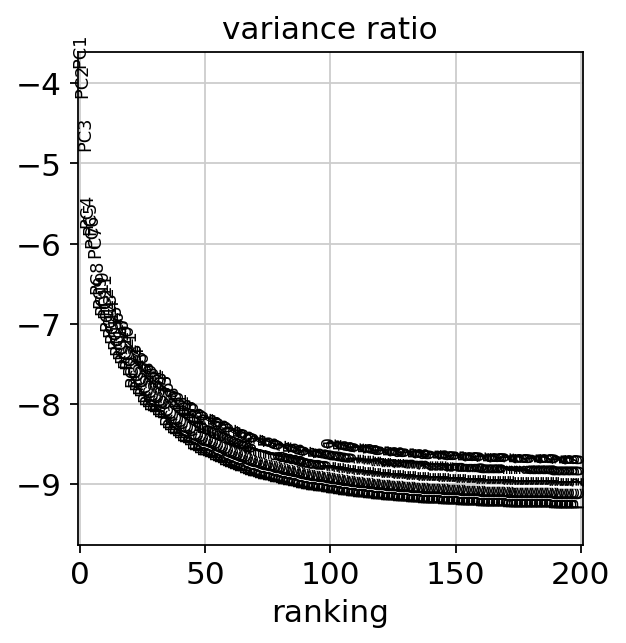

In [5]:
sc.pl.pca_variance_ratio(concat['adata'],log=True, n_pcs=200)

In [6]:
sc.tl.leiden(concat['adata'],resolution=0.8)

running Leiden clustering
    finished: found 29 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:03:10)


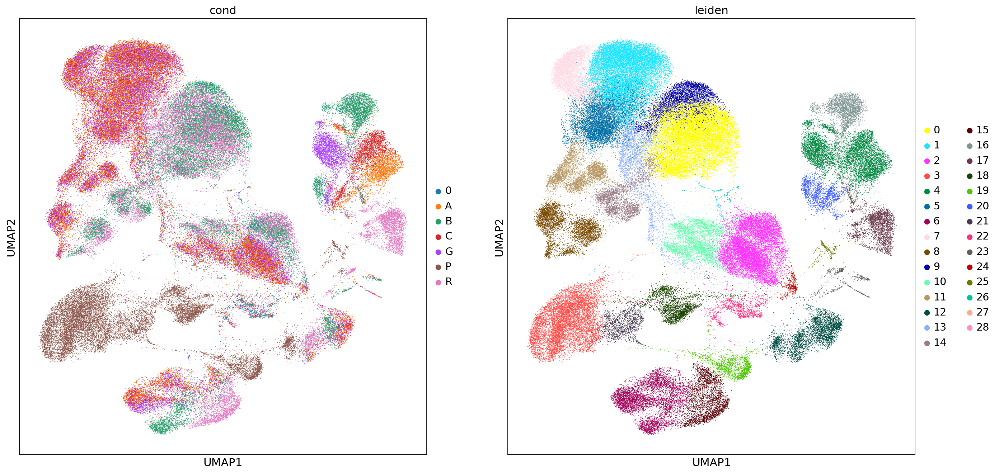

In [7]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
for color, ax in zip(['cond', 'leiden'], ax):
    sc.pl.umap(concat['adata'],color=color, ax=ax, show=False, return_fig=False, size=2)

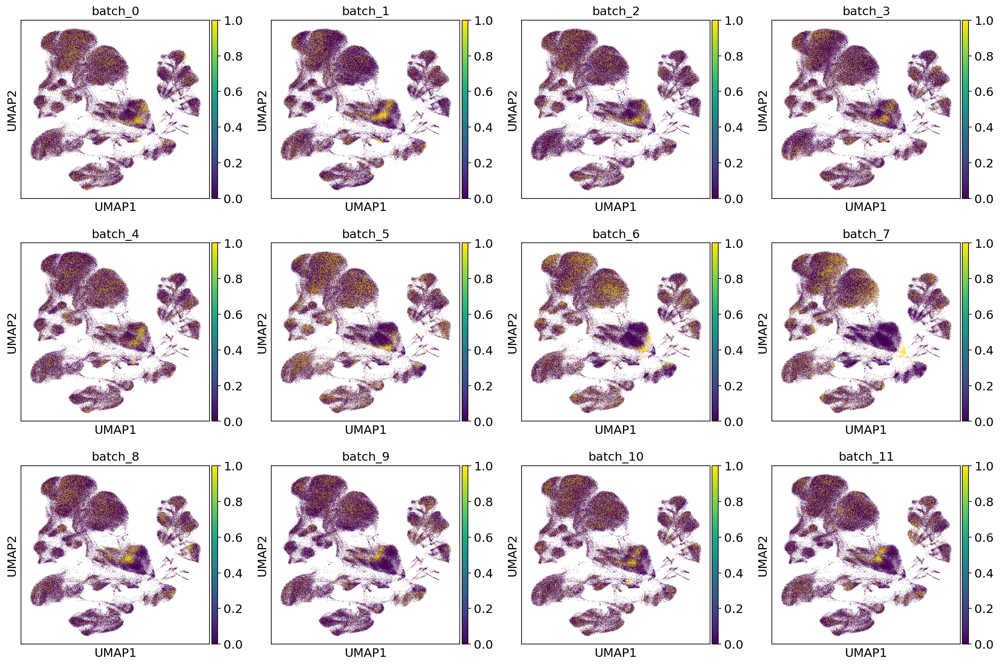

In [6]:
batches = concat['adata'].obs['batch'].unique() # get a list of the batches

# make a new column in the `.obs` for each batch that is of dtype `int` and that just takes on values of 0 and 1 so that it gets plotted as a continuous variable instead of a categorical one
for batch in batches:
    concat['adata'].obs['batch_%s' % batch] = (concat['adata'].obs['batch'] == batch).astype(int)
    
# plot now with sort_order=True, which should apply to this new continuous variable
sc.pl.umap(concat['adata'], color=['batch_%s' % i for i in batches],sort_order=True, ncols=4)

This seems to correct our batch effects in the non-mito populations. So I'm going to move forward with this matrix.

### Incoporate ADTs

In [8]:
path = prefix + '../adts/pkls/combat/concat.combat.adts.norm.log.pkl'
    
with open(path,'rb') as file:
    concat_adts = pkl.load(file)

In [9]:
transcripts = concat['adata'].var_names
proteins = concat_adts['adata'].var_names

I've decided to just put ADTs in the `.obs` for now.

In [10]:
adts_df = pd.DataFrame(concat_adts['adata'].X, columns=proteins, index=concat_adts['adata'].obs_names)

In [11]:
adts_df.columns

Index(['CD103|ITGAE', 'CD137|TNFRSF9', 'CD274|CD274', 'CD11b|ITGAM',
       'CD39|ENTPD1', 'CD197|CCR7', 'CD20|MS4A1', 'CD45RA|PTPRC', 'CD69|CD69',
       'CD275|ICOSLG', 'CD278|ICOS', 'CD134|TNFRSF4', 'CD279|PDCD1',
       'TCRgd|TRD_TRG', 'Tim3|HAVCR2', 'CD152|CTLA4', 'CD223|LAG3',
       'CD56|NCAM1', 'CD123|IL3RA', 'CD81|CD81', 'CD38|CD38', 'CD95|FAS',
       'CD28|CD28', 'CD27|CD27', 'CD25|IL2RA', 'CD8|CD8A', 'CD127|IL7R',
       'CD2|CD2', 'CD183|CXCR3', 'CD4|CD4', 'CD3|CD3E', 'CD196|CCR6',
       'CD45RO|PTPRC', 'CD14|CD14', 'CD194|CCR4', 'CD185|CXCR5', 'CD45|PTPRC',
       'CD24|CD24', 'CD7|CD7', 'CD33|CD33', 'CD90|THY1', 'CD80|CD80',
       'CD5|CD5', 'CD235a_b|GYPA_GYPB', 'CD62L|SELL', 'CD13|ANPEP', 'CD10|MME',
       'CD272|BTLA', 'CD16|FCGR3A', 'CD11c|ITGAX', 'CD86|CD86', 'IgD|IGHD',
       'IgG|IGHG1_2_3_4', 'CD184|CXCR4', 'CD34|CD34', 'CD163|CD163',
       'CD49d|ITGA4', 'CD117|KIT', 'CD314|KLRK1', 'HLA-ABC|HLA-A_B_C',
       'CD1a|CD1A', 'CD335|NCR1', 'CD61|ITGB3', 'CD19

Because I added the `obs` covariates to the ADTs matrix in it's own notebook (so that I could run combat with the extra covariates), all I have to do here is just concatenate.

In [12]:
concat['adata'].obs = concat['adata'].obs.join(adts_df)

Visualize some genes and proteins:

In [ ]:
check_name = ['HLA']
for i in proteins:
    for j in check_name:
        if j in i:
            print(i)

In [ ]:
check_name = ['HLA']
for i in transcripts:
    for j in check_name:
        if j in i:
            print(i)

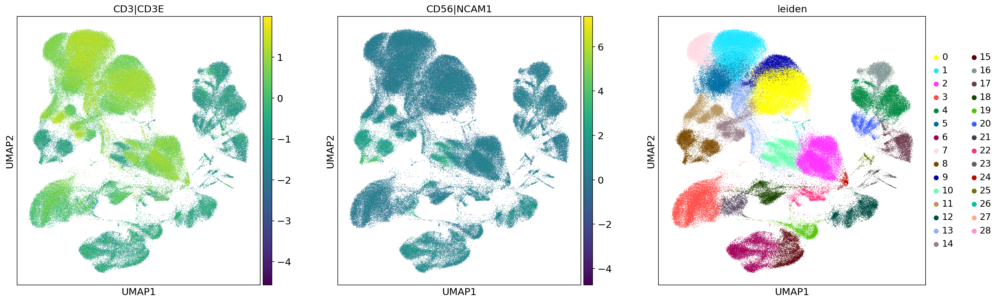

In [17]:
fig, ax = plt.subplots(1, 3, figsize=(23,7))
for color, ax in zip(['CD3|CD3E', 'CD56|NCAM1', 'leiden'], ax):
    sc.pl.umap(concat['adata'],color=color, ax=ax, show=False, return_fig=False, size=2)

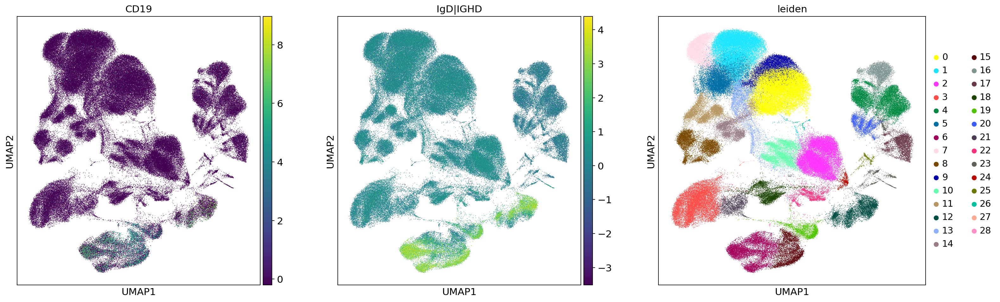

In [18]:
fig, ax = plt.subplots(1, 3, figsize=(23,7))
for color, ax in zip(['CD19','IgD|IGHD', 'leiden'], ax):
    sc.pl.umap(concat['adata'],color=color, ax=ax, show=False, return_fig=False, size=2)

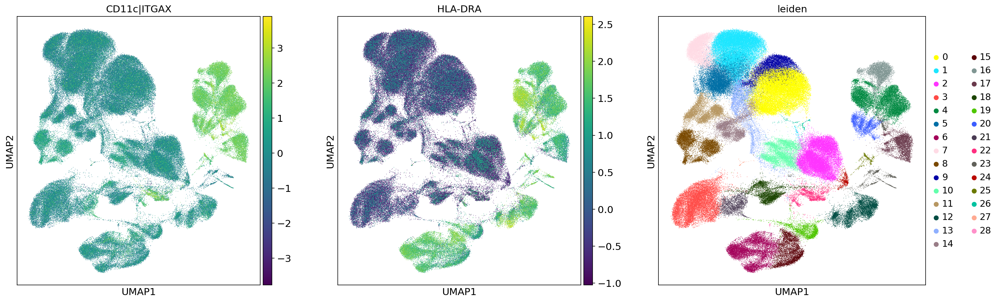

In [19]:
fig, ax = plt.subplots(1, 3, figsize=(23,7))
for color, ax in zip(['CD11c|ITGAX','HLA-DRA', 'leiden'], ax):
    sc.pl.umap(concat['adata'],color=color, ax=ax, show=False, return_fig=False, size=2)

### Split into Broad Cell Types

In [13]:
cts = ['tnk','b','m']

In [14]:
ct_tnk = [0, 1, 2, 3, 5, 7, 8, 9, 10, 11, 13, 14, 18, 21, 22, 24, 26, 27]
ct_b = [6, 12, 15, 19, 28]
ct_m = [4, 16, 17, 20, 23, 25]

In [15]:
ctdict = dict()
ctdict['tnk'] = ct_tnk
ctdict['b'] = ct_b
ctdict['m'] = ct_m
concat['adata'].obs['ct1'] = concat['adata'].obs['leiden']
for ct in ctdict:
    for clust in ctdict[ct]:
        concat['adata'].obs['ct1'].replace(str(clust), ct, inplace=True) 
concat['adata'].obs['ct1'] = concat['adata'].obs['ct1'].astype('category')

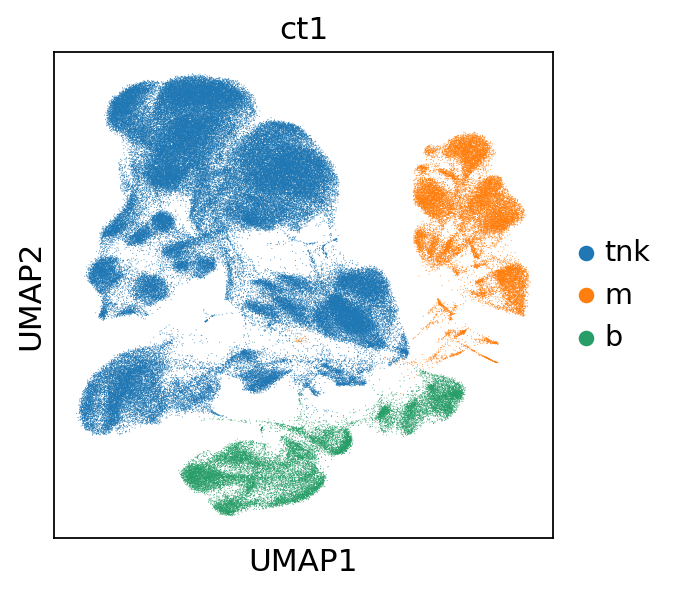

In [16]:
sc.pl.umap(concat['adata'], color=['ct1'])

### Store to Disk

Sadly, couldn't run this either on this machine, so had to run on my more powerful instance.

In [ ]:
## CODE I RAN ON A SEPARATE MACHINE IN A SCRIPT

# import scanpy as sc
# import pickle as pkl
# import pandas as pd
# sc.settings.verbosity = 4
# sc.settings.n_jobs=30

# path = '/data/codec/production.run/mrna/pkls/combat/concat.combat.dimred.pkl'
# with open(path,'rb') as file:
#     concat = pkl.load(file)

# sc.tl.leiden(concat['adata'],resolution=0.8)

# path = '/data/codec/production.run/adts/pkls/combat/concat.combat.adts.norm.log.pkl'
# with open(path,'rb') as file:
#     concat_adts = pkl.load(file)

# transcripts = concat['adata'].var_names
# proteins = concat_adts['adata'].var_names
# adts_df = pd.DataFrame(concat_adts['adata'].X, columns=proteins, index=concat_adts['adata'].obs_names)
# concat['adata'].obs = concat['adata'].obs.join(adts_df)
# ct_tnk = [0, 1, 2, 3, 5, 7, 8, 9, 10, 11, 13, 14, 18, 21, 22, 24, 26, 27]
# ct_b = [6, 12, 15, 19, 28]
# ct_m = [4, 16, 17, 20, 23, 25]
# cts = ['tnk','b','m']
# ctdict = dict()
# ctdict['tnk'] = ct_tnk
# ctdict['b'] = ct_b
# ctdict['m'] = ct_m
# concat['adata'].obs['ct1'] = concat['adata'].obs['leiden']
# for ct in ctdict:
#     for clust in ctdict[ct]:
#         concat['adata'].obs['ct1'].replace(str(clust), ct, inplace=True)
# concat['adata'].obs['ct1'] = concat['adata'].obs['ct1'].astype('category')

# for ct in cts:
#     ct_dict = dict()
#     ct_dict['adata'] = concat['adata'][concat['adata'].obs['ct1'] == ct].copy()

#     path = '/data/codec/production.run/pkls/cts/combat/%s.pkl' % ct

#     with open(path,'wb') as file:
#         pkl.dump(ct_dict, file, protocol=4)

Confirm they can be loaded in:

In [4]:
cts = ['tnk','b','m']
ct_dicts = dict()

In [5]:
for ct in tqdm(cts):
    path = prefix + '../pkls/cts/combat/%s.pkl' % ct
    
    with open(path,'rb') as file:
        ct_dicts[ct] = pkl.load(file)

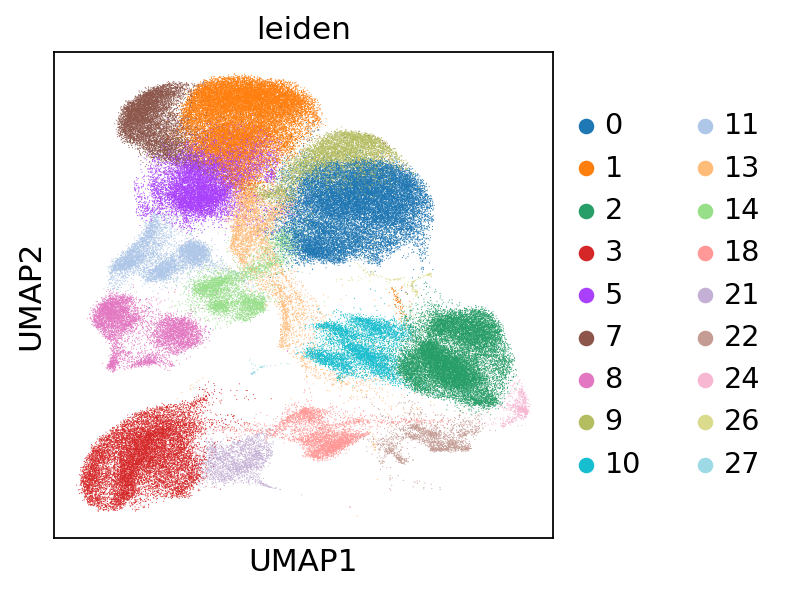

In [7]:
sc.pl.umap(ct_dicts['tnk']['adata'], color='leiden')

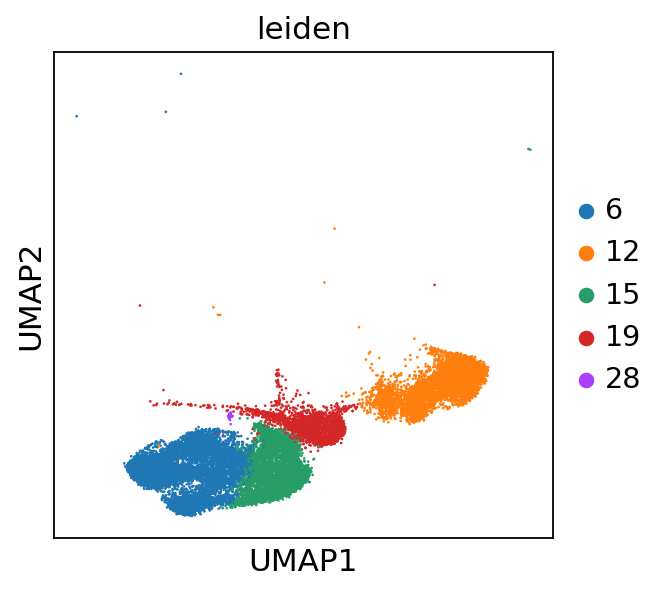

In [8]:
sc.pl.umap(ct_dicts['b']['adata'], color='leiden')

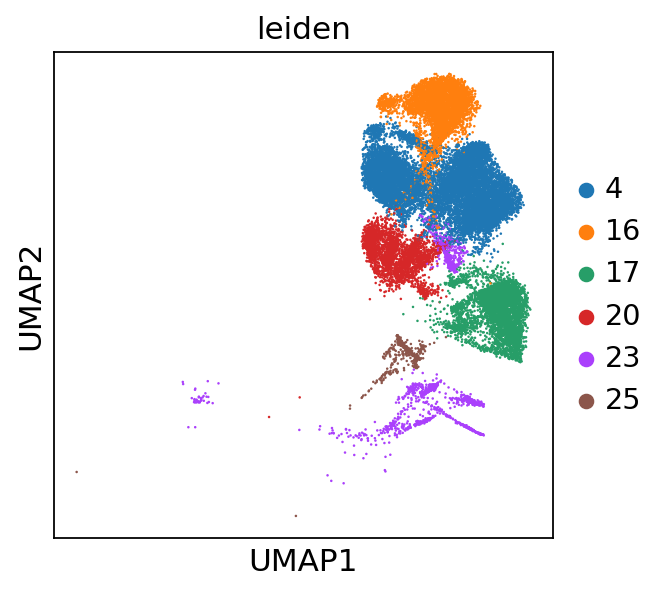

In [9]:
sc.pl.umap(ct_dicts['m']['adata'], color='leiden')